In [2]:
##############
## INITIATE ##
##############

## Imports
import numpy as np
import pandas as pd
from sklearn.metrics import pairwise_distances
from scipy.cluster.hierarchy import linkage, fcluster
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import cv2

## Figure parameters
plt.rcParams['figure.dpi'] = 300
figsize = (14,5)
custom_params = {'axes.spines.right': False, 
                 'axes.spines.top': False, 
                 'axes.facecolor':'whitesmoke'
                }
sns.set_theme(style="ticks", rc=custom_params)

#
###

In [3]:
###########################
## SCRIPT CONFIGURATIONS ##
###########################

## Define paths to embeddings
pti = '/Volumes/Elements/BDI/projects/GSG/outputs/o2_embeddings/ICGCC/model_resnet_icgcc_raw_FTL_25/'
# pti = '/Users/user/Documents/projects/GlandSeg/outputs/V2/o2_embeddings/tcga_ffpes/model_resnet_tcga_raw_FTL_0/'
embeddings_path = pti + 'embeddings.npy'
identifiers_path = pti + 'image_identifiers.csv'

## Define paths to images
dataset_path = '/Volumes/Elements/BDI/projects/GSG/outputs/o1_extracted_glands/ICGCC/'
# dataset_path = '/Users/user/Documents/projects/GlandSeg/outputs/V2/o1_extracted_glands/tcga_ffpes_V1'
# dataset_path = '/Users/user/Documents/projects/GlandSeg/outputs/V2_0_0_20250120/o1_extracted_glands/debug'

#
###

In [4]:
######################
## LOAD EMBEDDINGS  ##
######################

## Load the embeddings from the .npy file
embeddings = np.load(embeddings_path)

## Load identifiers
identifiers_df = pd.read_csv(identifiers_path)
image_filenames = identifiers_df['filename'].tolist()

## Check the shape of the loaded embeddings and identifiers
print(f'Loaded embeddings shape: {embeddings.shape}')
print(f'Loaded {len(image_filenames)} image identifiers')

#
###

Loaded embeddings shape: (107199, 512)
Loaded 107199 image identifiers


In [5]:
#######################
## FORMAT IDENTIFIER ##
#######################

## Get unique identifiers
split_marker = '.svs' # For TCGA
# split_marker = '_'
image_filenames_short = [fname.split(split_marker)[1] for fname in image_filenames]
# split_marker = '-01' # For TCGA
image_filenames_short = [fname.split(split_marker)[0] for fname in image_filenames] # For TCGA
# image_filenames_long = [fname.split('.svs')[0].replace('.','-') for fname in image_filenames] # For TCGA
unique_ids = np.unique(image_filenames_short)
num_groups = len(unique_ids)
print(num_groups)
# print(image_filenames_long[0])
numeric_ids = np.zeros(len(image_filenames_short))
k = 0
for unique_id in unique_ids:    
    index = np.argwhere(np.array(image_filenames_short) == unique_id)
    numeric_ids[index] = k
    k += 1

## Checks
print(image_filenames_short[0:10])
print(numeric_ids[0:10])

#
###

756
['TB08.0618_V5_01', 'TB08.0618_V5_01', 'TB08.0618_V5_01', 'TB08.0618_V5_01', 'TB08.0618_V5_01', 'TB08.0618_V5_01', 'TB08.0618_V5_01', 'TB08.0618_V5_01', 'TB08.0618_V5_01', 'TB08.0618_V5_01']
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [6]:
########################
## FORMAT COORDINATES ##
########################

## Get unique identifiers
# split_marker = '_'
# image_filenames_short = [fname.split(split_marker)[1] for fname in image_filenames]
split_marker = '__' # For TCGA
image_coords = [fname.split('__')[1].split('_') for fname in image_filenames] # For TCGA
image_coords_short = [[(int(coords[1])+int(coords[0]))/2, (int(coords[3])+int(coords[2]))/2] for coords in image_coords]

## Checks
print(image_filenames_short[5])
# print(image_filenames_long[5])
print(int(image_coords[0][0]))
print(image_coords_short[5])


#
###

TB08.0618_V5_01
1456
[2056.0, 4424.0]


In [7]:
######################
## COLLECT METADATA ##
######################

# Load your CSV file
PT_METADATA = '/Volumes/Elements/BDI/datasets/ICGCC/metadata/metadata_handformatted_v20250405.csv'
df = pd.read_csv(PT_METADATA)  # replace with actual filename

# Ensure 'slide_id' and 'relapse' columns exist
assert 'slide_id' in df.columns and 'relapse' in df.columns, "CSV must contain 'slide_id' and 'relapse' columns."

# Create a dictionary to map slide_id to relapse
slide_to_relapse = dict(zip(df['slide_id'], df['relapse']))

# Map relapse values to image_filenames_short
relapse_values = [slide_to_relapse.get(slide_id, 'NA') for slide_id in image_filenames_short]

## Check
k = np.where(np.array(relapse_values) == 1)[0][0]
print(image_filenames_short[k])
print(relapse_values[k])

#
###

TB08.0949_V4_01
1.0


In [8]:
####################
## SUBSET OBJECTS ##
####################

import random

# Example lists
# image_filenames_short = [...]
# image_coords = [...]
# image_coords_short = [...]
# numeric_ids = [...]

# Ensure all lists are the same length
assert len(image_filenames_short) == len(image_coords) == len(image_coords_short) == len(numeric_ids), "Lists must be the same length."

# Get 10,000 unique random indices
num_samples = 20000
indices = random.sample(range(len(image_filenames_short)), num_samples)

# Use the indices to subset each list
image_filenames = [image_filenames[i] for i in indices] 
image_filenames_short = [image_filenames_short[i] for i in indices]
image_coords = [image_coords[i] for i in indices]
image_coords_short = [image_coords_short[i] for i in indices]
embeddings = [embeddings[i] for i in indices]
numeric_ids = np.array([numeric_ids[i] for i in indices])
relapse_values = np.array([relapse_values[i] for i in indices])

#
###

In [9]:
############################
## STANDARDISE EMBEDDINGS ##
############################

from sklearn.preprocessing import StandardScaler

# Standardize embeddings before clustering
scaler = StandardScaler()
embeddings = scaler.fit_transform(embeddings)

#
###

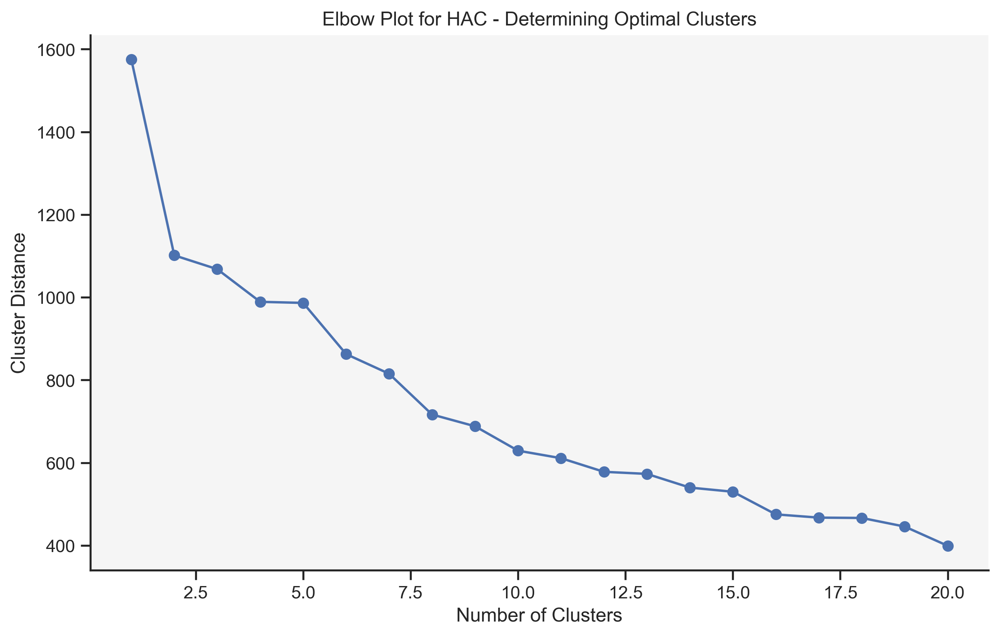

In [10]:
###############################
## PERFORM HAC ON EMBEDDINGS ##
###############################

## Perform hierarchical agglomerative clustering (HAC) on the high-dimensional embeddings
linkage_matrix = linkage(embeddings, method='ward')  ## Using Ward's method for clustering

## Elbow plot to determine the optimal number of clusters
last = linkage_matrix[-20:, 2]
last_rev = last[::-1]
idxs = np.arange(1, len(last) + 1)
plt.figure(figsize=(10, 6))
plt.plot(idxs, last_rev, marker="o")
plt.title('Elbow Plot for HAC - Determining Optimal Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Cluster Distance')
plt.grid(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.show()

#
###

In [11]:
#########################
## SAVE DATA FOR PLOTS ##
#########################

import os, numpy as np

# compute elbow data
last = linkage_matrix[-20:, 2][::-1]
idxs = np.arange(1, last.size + 1)

# user-defined output folder (set to None for current dir)
out_dir = '/Volumes/Elements/BDI/projects/GSG/figures/icgc-c-ftl1'  # e.g. 'results/hac' or None
if out_dir:
    os.makedirs(out_dir, exist_ok=True)
base = out_dir or '.'

# save arrays
np.save(f"{base}/hac_elbow_idxs.npy", idxs)
np.save(f"{base}/hac_elbow_distances.npy", last)

#
###

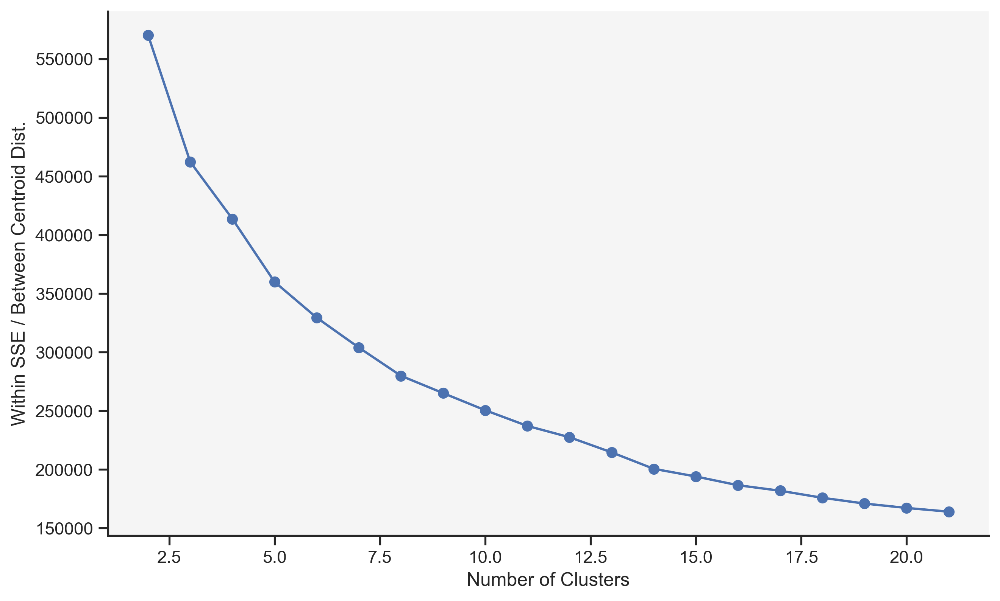

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import fcluster

# assume linkage_matrix and embeddings are already defined

last = linkage_matrix[-20:, 2][::-1]
ks = np.arange(2, len(last) + 2)   # start at 2 clusters

ratios = []
for k in ks:
    labels = fcluster(linkage_matrix, k, criterion='maxclust')
    # centroids
    uniq = np.unique(labels)
    centroids = np.vstack([embeddings[labels==ci].mean(axis=0)
                           for ci in uniq])
    # within-cluster SSE (scalar per cluster)
    w_sse = sum(
        np.sum((embeddings[labels==ci] - c)**2)
        for ci, c in zip(uniq, centroids)
    )
    # between-centroid mean distance
    dmat = np.sqrt(((centroids[:,None] - centroids[None,:])**2).sum(-1))
    i, j = np.triu_indices(len(uniq), k=1)
    b_mean = dmat[i,j].mean()            # now guaranteed non-empty for k>=2

    ratios.append(w_sse / b_mean)

plt.figure(figsize=(10,6))
plt.plot(ks, ratios, marker='o')
# plt.title('Elbow: Within‐SSE / Mean Between‐Centroid Distance')
plt.xlabel('Number of Clusters')
plt.ylabel('Within SSE / Between Centroid Dist.')
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.show()

In [12]:
#######################################
## SELECT OPTIMAL NUMBER OF CLUSTERS ##
#######################################

## HAC parameters
num_clusters = 15  ## Set to the optimal number of clusters identified earlier

## Assign cluster labels based on the specified number of clusters
cluster_labels = fcluster(linkage_matrix, num_clusters, criterion='maxclust')

## Check the result
print(f'Cluster labels assigned to {len(cluster_labels)} images')

#
###

Cluster labels assigned to 20000 images


In [13]:
#########################################
## SAVE EMBEDDINGS AND CLUSTER LABELS  ##
#########################################

## Create a dataframe to store the embeddings and their corresponding cluster labels
clustered_data = pd.DataFrame({
    'filename': image_filenames,
    'cluster_label': cluster_labels
})

## Save the cluster labels to a CSV file
output_path = pti + 'image_identifiers_and_reference_clusters.csv'  ## Replace with your desired output path
clustered_data.to_csv(output_path, index=False)

## End
print(f'Clustered data saved to {output_path}')

#
###

Clustered data saved to /Volumes/Elements/BDI/projects/GSG/outputs/o2_embeddings/ICGCC/model_resnet_icgcc_raw_FTL_25/image_identifiers_and_reference_clusters.csv


In [14]:
###########################
## APPLY t-SNE REDUCTION ##
###########################

## Local imports
from sklearn.manifold import TSNE

## t-SNE parameters
n_components = 2  ## Set to 3 for 3D visualization
perplexity = 30  # Similar to UMAP's n_neighbors
learning_rate = 200  # Default recommended learning rate
random_state = 42

## Initialize t-SNE reducer
tsne_reducer = TSNE(n_components=n_components, perplexity=perplexity, learning_rate=learning_rate, random_state=random_state)

## Fit and transform the embeddings
reduced_embeddings = tsne_reducer.fit_transform(embeddings)

## Check the shape of the reduced embeddings
print(f'Reduced embeddings shape: {reduced_embeddings.shape}')

#
###

Reduced embeddings shape: (20000, 2)


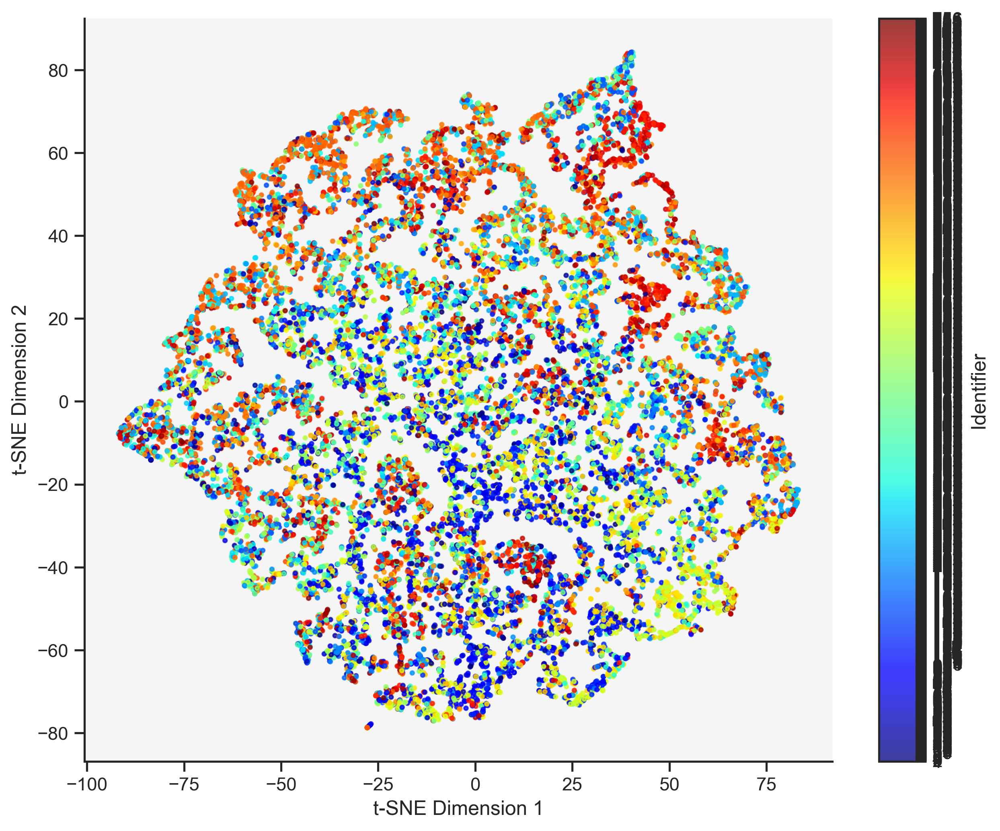

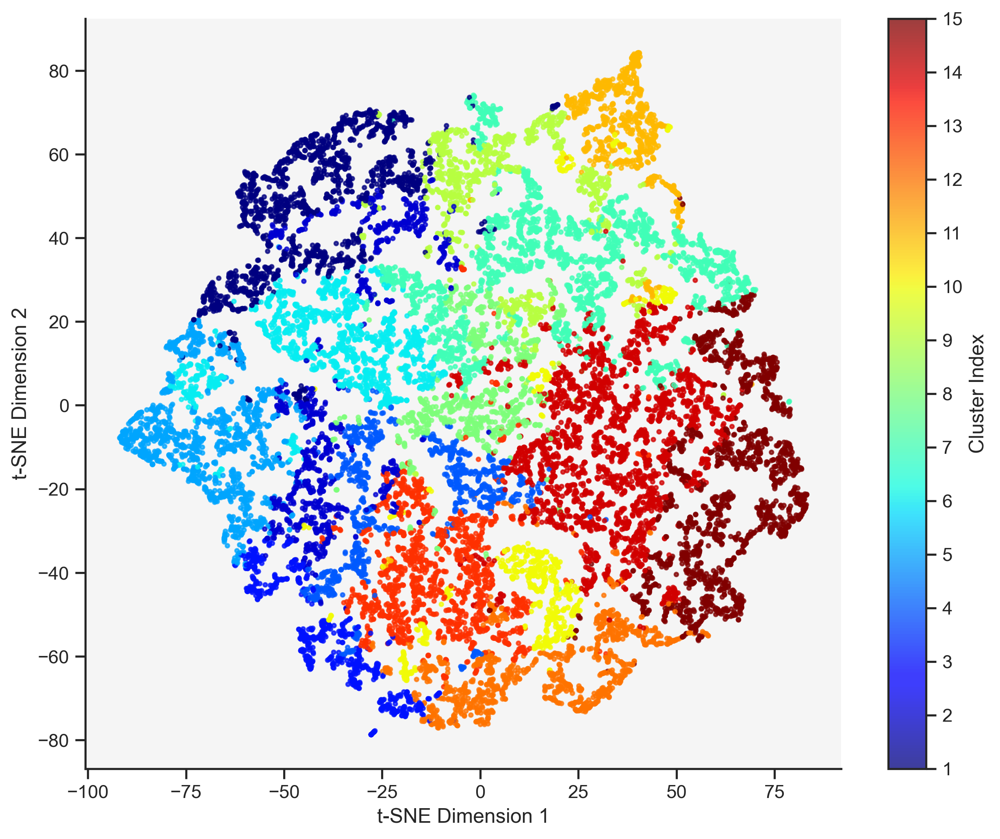

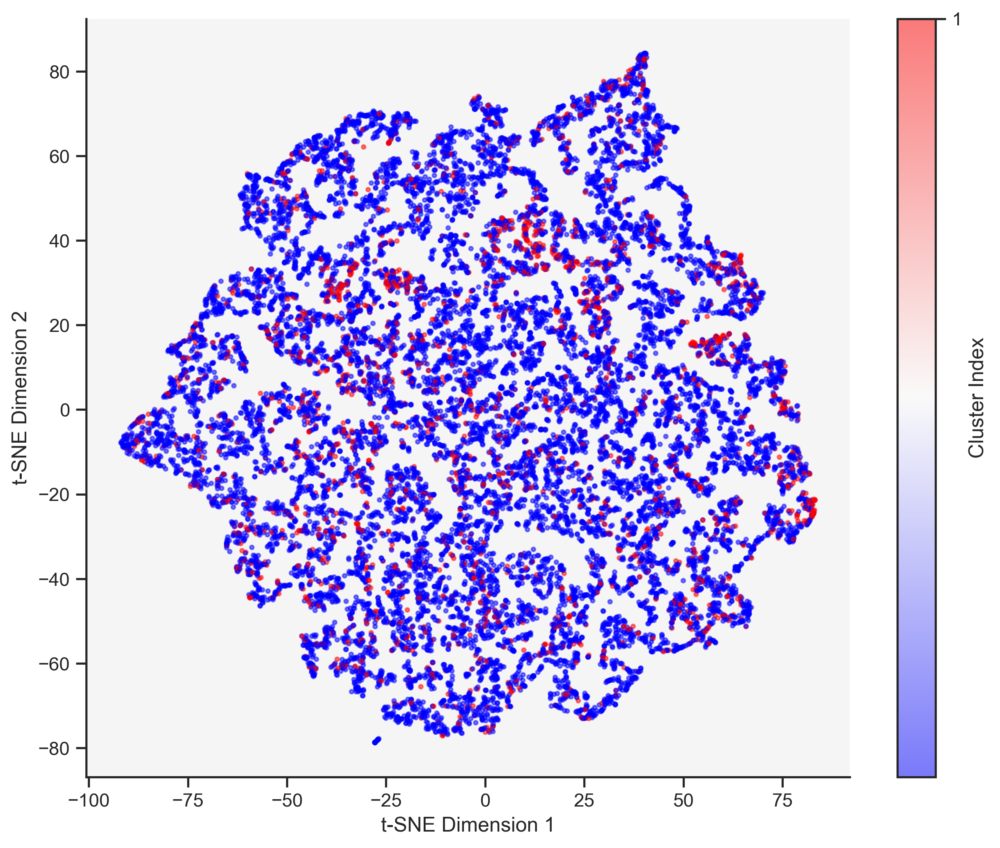

In [16]:
##############################################
## UPDATE t-SNE VISUALIZATION WITH CLUSTERS ##
##############################################

## 2D Visualization with clusters
if n_components == 2:

    ## t-SNE with ID
    plt.figure(figsize=(10, 8))    
    scatter = plt.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1], 
                          c=numeric_ids + 1, cmap='jet', s=5, alpha=0.75)    
    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')
    plt.grid(False)
    plt.colorbar(scatter, ticks=range(1, num_groups + 1), label='Identifier')
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.show()

    ## t-SNE with cluster index
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1], 
                          c=cluster_labels, cmap='jet', s=5, alpha=0.75)    
    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')
    plt.grid(False)
    plt.colorbar(scatter, ticks=range(1, num_clusters + 1), label='Cluster Index')
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.show()

    ## t-SNE with relapse
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1], 
                          c=relapse_values, cmap='bwr', s=5, alpha=0.5)    
    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')
    plt.grid(False)
    plt.colorbar(scatter, ticks=range(1, num_clusters + 1), label='Cluster Index')
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.show()


#
###

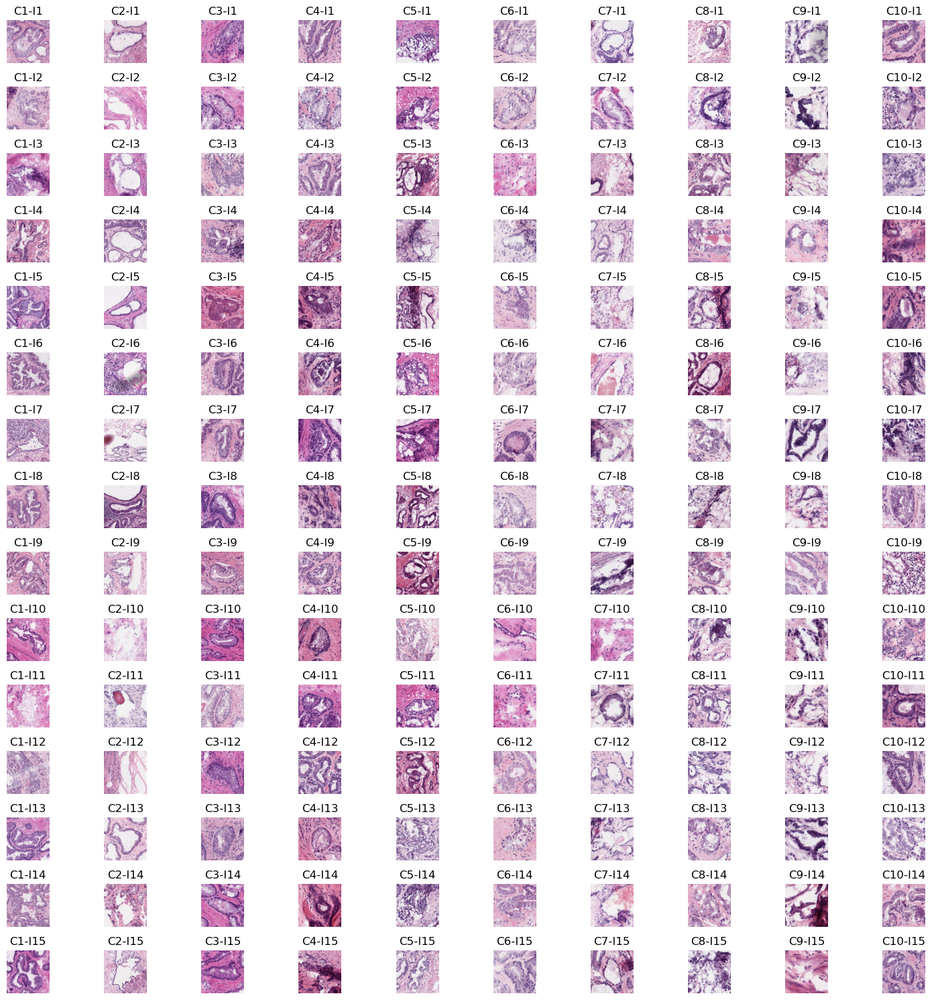

In [18]:
##########################################
## PICK AND SHOW EXAMPLES FROM CLUSTERS ##
##########################################

examples_per_cluster = 15  ## Number of examples to show per cluster

## Initialize figure for examples
fig, axs = plt.subplots(examples_per_cluster, num_clusters, figsize=(15, 15))

## Compute cluster centroids
cluster_centroids = []
for cluster_idx in range(1, num_clusters + 1):
    cluster_embeddings = [embeddings[i] for i in range(len(cluster_labels)) if cluster_labels[i] == cluster_idx]
    cluster_centroid = np.mean(cluster_embeddings, axis=0)
    cluster_centroids.append(cluster_centroid)

## Loop over clusters
for cluster_idx in range(1, num_clusters + 1):
    
    ## Get all indices in the current cluster
    cluster_indices = [i for i in range(len(cluster_labels)) if cluster_labels[i] == cluster_idx]
    cluster_files = [image_filenames[i] for i in cluster_indices]
    cluster_embeddings = [embeddings[i] for i in cluster_indices]
    
    ## Compute distances to centroid
    distances = pairwise_distances(cluster_embeddings, [cluster_centroids[cluster_idx - 1]])
    closest_indices = np.argsort(distances[:, 0])[:examples_per_cluster]
    selected_files = np.array(cluster_files)[closest_indices]

    ## Load and display each example
    for example_idx, filename in enumerate(selected_files):
        image_path = f'{dataset_path}/{filename}'
        image_path = image_path.replace('_mask_both','_raw')
        image = Image.open(image_path)
        #
        axs[example_idx, cluster_idx - 1].imshow(image)
        axs[example_idx, cluster_idx - 1].axis('off')
        axs[example_idx, cluster_idx - 1].set_title(f'C{cluster_idx}-I{example_idx + 1}')

plt.tight_layout()
plt.show()

#
###

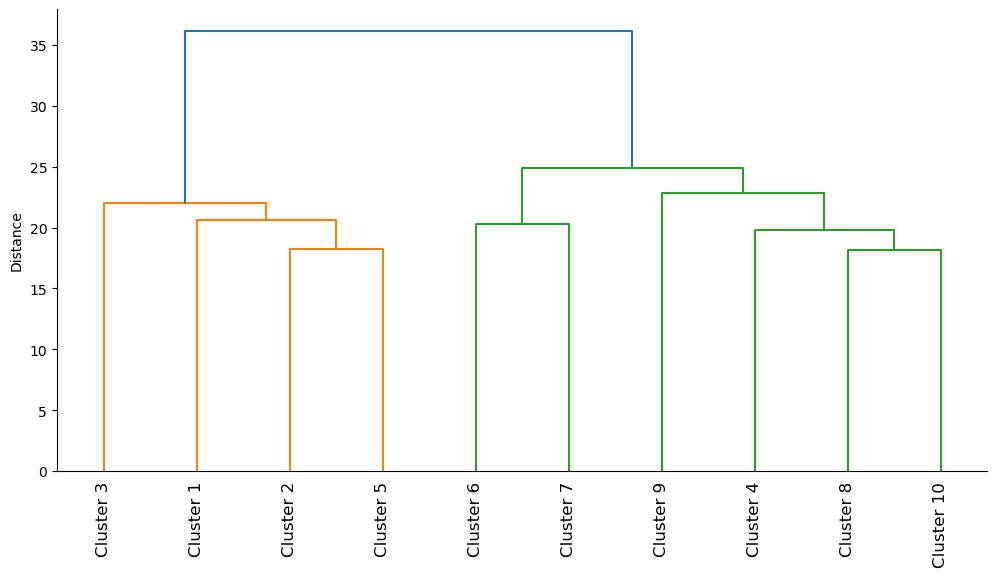

In [15]:
######################################
## VISUALIZE DENDROGRAM OF CLUSTERS ##
######################################

from scipy.cluster.hierarchy import dendrogram

## Compute linkage matrix for hierarchical clustering
linkage_matrix = linkage(cluster_centroids, method='ward')

## Plot dendrogram
plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix, labels=[f'Cluster {i+1}' for i in range(num_clusters)], leaf_rotation=90, leaf_font_size=12)
# plt.title('Hierarchical Clustering Dendrogram')
# plt.xlabel('Cluster')
plt.ylabel('Distance')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.show()

#
###

In [16]:
"""
##########################
## CLUSTER DISTRIBUTION ##
##########################

## Convert to a DataFrame for easier manipulation
data = pd.DataFrame({
    'Cluster': cluster_labels,
    'Identifier': numeric_ids
})

## Get the unique clusters and identifiers
unique_clusters = sorted(data['Cluster'].unique())
unique_identifiers = sorted(data['Identifier'].unique())

## Count the frequency of clusters for each identifier
frequency_table = data.groupby(['Identifier', 'Cluster']).size().unstack(fill_value=0)

## Normalize the frequencies if needed (e.g., proportions instead of counts)
frequency_table = frequency_table.div(frequency_table.sum(axis=1), axis=0)

## Define an offset for each identifier
bar_width = 0.8 / len(unique_identifiers)  # Divide bar width among identifiers
x_offsets = np.linspace(-bar_width * (len(unique_identifiers) - 1) / 2, 
                        bar_width * (len(unique_identifiers) - 1) / 2, 
                        len(unique_identifiers))

## Plot the offset barplot
plt.figure(figsize=(10, 6))

for idx, identifier in enumerate(unique_identifiers):
    frequencies = frequency_table.loc[identifier]
    plt.bar(
        np.array(unique_clusters) + x_offsets[idx],  # Offset x positions
        frequencies,
        width=bar_width,  # Narrower bars to accommodate offsets
        alpha=0.7,  # Transparency for overlay
        label=f'ID {identifier + 1:.0f}'
    )

# Add labels, legend, and title
plt.xlabel('Cluster Index')
plt.ylabel('Frequency of Samples')
# plt.title('Cluster Frequency per Identifier')
plt.xticks(unique_clusters)  # Ensure all clusters are shown on the x-axis
plt.legend(title='Identifier', loc='upper right')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.tight_layout()
plt.show()

#
###
"""

"\n##########################\n## CLUSTER DISTRIBUTION ##\n##########################\n\n## Convert to a DataFrame for easier manipulation\ndata = pd.DataFrame({\n    'Cluster': cluster_labels,\n    'Identifier': numeric_ids\n})\n\n## Get the unique clusters and identifiers\nunique_clusters = sorted(data['Cluster'].unique())\nunique_identifiers = sorted(data['Identifier'].unique())\n\n## Count the frequency of clusters for each identifier\nfrequency_table = data.groupby(['Identifier', 'Cluster']).size().unstack(fill_value=0)\n\n## Normalize the frequencies if needed (e.g., proportions instead of counts)\nfrequency_table = frequency_table.div(frequency_table.sum(axis=1), axis=0)\n\n## Define an offset for each identifier\nbar_width = 0.8 / len(unique_identifiers)  # Divide bar width among identifiers\nx_offsets = np.linspace(-bar_width * (len(unique_identifiers) - 1) / 2, \n                        bar_width * (len(unique_identifiers) - 1) / 2, \n                        len(unique_identi

In [19]:
#################
## SAVE OUTPUT ##
#################

import pandas as pd

# Assuming all vectors are of the same length
data = {
    'reduced_embeddings_x': [_[0] for _ in reduced_embeddings],
    'reduced_embeddings_y': [_[1] for _ in reduced_embeddings],
    'cluster_labels': cluster_labels,
    'numeric_ids': numeric_ids,
    'ggrade': relapse_values
}

# Create DataFrame
print(reduced_embeddings[0])
print(cluster_labels[0])
print(numeric_ids[0])
print(relapse_values[0])
df = pd.DataFrame(data)

# Save to CSV
df.to_csv(pti + 'reduced_embeddings_and_labels.csv', index=False)

print('CSV file saved')

#
###

[ 11.590574 -53.664005]
9
88.0
0.0
CSV file saved


In [ ]:
###############################
## FUNCTIONS FOR PHENOTYPING ##
###############################

def binarise_image(image, thresholds=[30,30,30]):
    """
    Binarise image based on threshold for each channels.
    """
    for i in range(3):
        image[:,:,i] = (image[:,:,i] > thresholds[i])
    return image

def isolate_focal_gland(epithelial_prob, lumen_prob, threshold=0.5):
    """
    Isolates the focal gland in an image based on epithelial and luminal probability maps.
    """
    ## Step 1: Binarize the probability maps
    epithelial_mask = (epithelial_prob >= threshold).astype(np.uint8)
    lumen_mask = (lumen_prob >= threshold).astype(np.uint8)
    
    ## Step 2: Combine the binary masks to create a gland mask
    gland_mask = np.logical_or(epithelial_mask, lumen_mask).astype(np.uint8)
    
    # Step 3: Find connected components
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(gland_mask, connectivity=8)
    
    ## Step 4: Identify the connected component containing the image center
    H, W = gland_mask.shape
    center_x, center_y = W // 2, H // 2
    
    focal_label = None
    for label in range(1, num_labels):  # Skipping background label (0)
        x, y, w, h, area = stats[label]
        if x <= center_x < x + w and y <= center_y < y + h:
            focal_label = label
            break
    
    if focal_label is not None:
        ## Step 5: Generate the final gland mask
        focal_gland_mask = (labels == focal_label).astype(np.uint8)
    else:
        ## If no gland is found at the center, return an empty mask
        focal_gland_mask = np.zeros_like(gland_mask, dtype=np.uint8)
    
    return focal_gland_mask

def compute_features(image, gland_mask):
    """
    Computes relative area and shape analysis features from the given binarized image and gland mask.
    """
    features = {}
    H, W = image.shape[:2]
    total_pixels = H * W
    
    nuclei_mask = image[:,:,0]
    epithelial_mask = image[:,:,1]
    lumen_mask = (1 - gland_mask) * epithelial_mask # image[:,:,2]

    # features['area'] = np.sum(gland_mask)
    
    ## Compute relative area features    
    features['relative_area_nuclei'] = np.sum(nuclei_mask) / total_pixels
    features['relative_area_epithelia'] = np.sum(epithelial_mask) / total_pixels
    features['relative_area_lumen'] = np.sum(lumen_mask) / total_pixels
    features['relative_area_epithelial_nuclei'] = np.sum(nuclei_mask * epithelial_mask) / total_pixels
    features['relative_area_non_epithelial_nuclei'] = np.sum(nuclei_mask * (1 - gland_mask)) / total_pixels
    
    ## Shape analysis features
    gland_contours, _ = cv2.findContours(gland_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if gland_contours:
        cnt = max(gland_contours, key=cv2.contourArea)        
        # features['area'] = cv2.contourArea(cnt)
        features['perimeter'] = cv2.arcLength(cnt, True)        
        # hull = cv2.convexHull(cnt)
        # features['convex_hull_area'] = cv2.contourArea(hull)
        # features['compactness'] = features['area'] / features['convex_hull_area'] if features['convex_hull_area'] > 0 else 0        
        # features['roundness'] = (4 * np.pi * features['area']) / (features['perimeter']**2) if features['perimeter'] > 0 else 0
    else:
        features.update({# 'area': 0, 
                         'perimeter': 0, 
                         # 'convex_hull_area': 0, 
                         # 'compactness': 0,
                         # 'roundness': 0,
        })
    
    return features

#
###

In [ ]:
########################
## PHENOTYPE CLUSTERS ##
########################

## Initialize storage for features
examples_per_cluster = 100  ## Number of examples to show per cluster
cluster_feature_data = []

## Compute cluster centroids
cluster_centroids = []
for cluster_idx in range(1, num_clusters + 1):
    cluster_embeddings = [embeddings[i] for i in range(len(cluster_labels)) if cluster_labels[i] == cluster_idx]
    cluster_centroid = np.mean(cluster_embeddings, axis=0)
    cluster_centroids.append(cluster_centroid)

## Loop over clusters
for cluster_idx in range(1, num_clusters + 1):
    
    ## Get all indices in the current cluster
    cluster_indices = [i for i in range(len(cluster_labels)) if cluster_labels[i] == cluster_idx]
    cluster_files = [image_filenames[i] for i in cluster_indices]
    cluster_embeddings = [embeddings[i] for i in cluster_indices]
    
    ## Compute distances to centroid
    distances = pairwise_distances(cluster_embeddings, [cluster_centroids[cluster_idx - 1]])
    closest_indices = np.argsort(distances[:, 0])[:examples_per_cluster]
    selected_files = np.array(cluster_files)[closest_indices]
    
    ## Process each selected image
    for filename in selected_files:
        image_path = f'{dataset_path}/{filename}'
        image = np.array(Image.open(image_path))
        
        ## Binarize image
        image = binarise_image(image)
        
        ## Get gland mask
        mask = isolate_focal_gland(image[:,:,0], image[:,:,1])
        
        ## Compute features
        features = compute_features(image, mask)
        features['cluster'] = cluster_idx  # Assign cluster label
        cluster_feature_data.append(features)

## Convert feature data to DataFrame
feature_df = pd.DataFrame(cluster_feature_data)

#
###

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde

####################################
## VISUALISE FEATURE DISTRIBUTION ##
####################################

## Get unique clusters and number of features
feature_names = feature_df.columns[:-1]  # Exclude 'cluster' column
num_features = len(feature_names)
clusters = sorted(feature_df['cluster'].unique())  # Ensure ordered clusters
num_clusters = len(clusters)

## Get colors from the 'jet' colormap
cmap = plt.get_cmap('jet')
colors = [cmap(i / (num_clusters - 1)) for i in range(num_clusters)]

fig, axs = plt.subplots(nrows=num_features, ncols=1, figsize=(12, 2 * num_features), sharex=True)

for i, feature in enumerate(feature_names):
    ax = axs[i]

    for j, cluster in enumerate(clusters):
        ## Extract data for the current cluster
        cluster_data = feature_df[feature_df['cluster'] == cluster][feature].dropna()

        if len(cluster_data) < 2:  # Avoid KDE errors with small data
            continue

        ## Compute KDE (Kernel Density Estimate)
        kde = gaussian_kde(cluster_data, bw_method='scott')
        x_vals = np.linspace(cluster_data.min(), cluster_data.max(), 300)  # Smooth X axis
        y_vals = kde(x_vals)  # Compute density

        ## Normalize KDE height for proper spacing
        y_vals = y_vals / y_vals.max() * 0.5  # Scale KDE to avoid excessive overlap

        ## Compute percentiles for shading
        p2_5, p25, p75, p97_5 = np.percentile(cluster_data, [2.5, 25, 75, 97.5])

        ## Offset each cluster's distribution along the x-axis
        cluster_x_offset = j  # Shift KDE position based on cluster index

        ## Shade the interquartile range (25-75%) in salmon
        mask = (x_vals >= p25) & (x_vals <= p75)
        # ax.fill_betweenx(x_vals[mask], cluster_x_offset, cluster_x_offset + y_vals[mask], color='salmon', alpha=0.6, label="IQR" if j == 0 else "")
        
        ## Shade the full 2.5%-97.5% range in grey
        # ax.fill_betweenx(x_vals, cluster_x_offset, cluster_x_offset + y_vals, color='grey', alpha=0.4)

        ## Plot KDE outline for better visibility
        # ax.plot(cluster_x_offset + y_vals, x_vals, color="grey", linewidth=1.5, alpha=0.4)

        ax.fill_betweenx(x_vals, cluster_x_offset, cluster_x_offset + y_vals, color=colors[j], alpha=0.4)
        ax.fill_betweenx(x_vals[mask], cluster_x_offset, cluster_x_offset + y_vals[mask], color=colors[j], alpha=0.8, label="IQR" if j == 0 else "")
        # ax.plot(cluster_x_offset + y_vals, x_vals, color=colors[j], linewidth=1.5, alpha=0.9)

    ## Add a horizontal mean line
    mean_value = feature_df[feature].mean()
    ax.axhline(mean_value, color='grey', linestyle='dotted', linewidth=1.5, alpha=0.7, label="Mean")

    ## **Format the feature name (replace '_' with space)**
    formatted_feature_name = feature.replace('_', ' ')
    ax.set_ylabel(formatted_feature_name, fontsize=12)

    ## Adjust x-axis ticks to reflect cluster positions
    ax.set_xticks(range(num_clusters))
    ax.set_xticklabels(clusters, fontsize=10)

    ## Log scale for specific features
    if feature in ['area', 'perimeter', 'convex_hull_area']:
        ax.set(yscale="log")

    ## Improve aesthetics
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

## **Set x-axis label for clusters**
axs[-1].set_xlabel("Cluster Index", fontsize=12)

plt.tight_layout()
plt.show()


In [ ]:
###########################
## SAVE DATA TO CSV FILE ##
###########################

import pandas as pd

## Assemble data into a dictionary with properly formatted bounding box coordinates
data_dict = {
    "image_filenames": image_filenames,
    "image_filenames_short": image_filenames_short,
    "image_filenames_long": image_filenames_long,
    "numeric_ids": numeric_ids,
    "min_x": [coord[0] for coord in image_coords],  # Extract min_x
    "max_x": [coord[1] for coord in image_coords],  # Extract max_x
    "min_y": [coord[2] for coord in image_coords],  # Extract min_y
    "max_y": [coord[3] for coord in image_coords],  # Extract max_y
    "image_coords_short_x": [coord[0] for coord in image_coords_short],  # Short X (centered)
    "image_coords_short_y": [coord[1] for coord in image_coords_short],  # Short Y (centered)
    "cluster_labels": cluster_labels,
    "ggrade": ggrade
}

## Convert to DataFrame
df_output = pd.DataFrame(data_dict)

## Define output file path
output_csv_path = pti + 'summary_reference_clusters.csv'

## Save DataFrame to CSV
df_output.to_csv(output_csv_path, index=False)

print(f"Saved clustered image data to {output_csv_path}")

#
###

In [ ]:
"""
############################################
## PLOT FILTERED DATA BY CLUSTER LABEL ##
############################################

import matplotlib.pyplot as plt

## Filter the DataFrame for the specific case
filtered_df = df_output[df_output["image_filenames_short"] == "TCGA-HC-A6AP"]

## Scatter plot
plt.figure(figsize=(10, 8))  
#
scatter = plt.scatter(
    filtered_df["image_coords_short_y"],
    filtered_df["image_coords_short_x"],
    c=filtered_df["cluster_labels"],  # Color by cluster labels
    cmap="jet",
    # edgecolors="k",
    alpha=1.0,
    s=1
)
#
## Add a colorbar
plt.colorbar(scatter, label="Cluster Label")
#
## Labels and title
plt.xlabel("Image Coords Short Y")
plt.ylabel("Image Coords Short X")
# plt.title("Spatial Distribution of Clustered Glands for TCGA-HC-A6AP")
#
## Invert Y-axis (if needed, depending on image origin)
plt.gca().invert_yaxis()
#
##
sns.despine()
#
## End
plt.show()

## Scatter plot
plt.figure(figsize=(10, 8))  
#
scatter = plt.scatter(
    filtered_df["image_coords_short_y"],
    filtered_df["image_coords_short_x"],
    c=filtered_df["ggrade"],  # Color by cluster labels
    cmap="jet",
    # edgecolors="k",
    alpha=1.0,
    s=1
)
#
## Add a colorbar
plt.colorbar(scatter, label="Gleason Grade")
#
## Labels and title
plt.xlabel("Image Coords Short Y")
plt.ylabel("Image Coords Short X")
# plt.title("Spatial Distribution of Clustered Glands for TCGA-HC-A6AP")
#
## Invert Y-axis (if needed, depending on image origin)
plt.gca().invert_yaxis()
#
##
sns.despine()
#
## End
plt.show()

#
###
"""

In [ ]:
"""
#######################
## FILTER EMBEDDINGS ##
#######################

## Remove files from data
index = np.argwhere((cluster_labels != 5) & (cluster_labels != 6)).flatten()
embeddings = embeddings[index]
reduced_embeddings = reduced_embeddings[index]
cluster_labels = cluster_labels[index]
numeric_ids = numeric_ids[index]
image_filenames = np.array(image_filenames)[index]

#
###
"""

In [ ]:
"""
######################
## PHENOTYPE GLANDS ##
######################

## Load image
image_path = f'{dataset_path}/{image_filenames[10]}'
image = np.array(Image.open(image_path))

## Binarise image
image = binarise_image(image)

## Get mask
mask = isolate_focal_gland(image[:,:,0], image[:,:,1])

## Visualise
plt.imshow(image * 255 * mask[:,:,None])

## Compute features
features = compute_features(image, mask)
print(features)

#
###
"""

In [ ]:
"""
##########################################
## PICK AND SHOW EXAMPLES FROM CLUSTERS ##
##########################################

## Initialize figure for examples
fig, axs = plt.subplots(examples_per_cluster, num_clusters, figsize=(15, 15))

## Loop over clusters
for cluster_idx in range(1, num_clusters + 1):
    
    ## Get all filenames in the current cluster
    cluster_files = [image_filenames[i] for i in range(len(cluster_labels)) if cluster_labels[i] == cluster_idx]
    
    ## Select a few examples from the cluster
    s = np.random.choice(len(cluster_files), examples_per_cluster, replace=False)
    selected_files = np.array(cluster_files)[s]
    # selected_files = cluster_files[:examples_per_cluster]  ## Adjust if there are fewer files    

    ## Load and display each example
    for example_idx, filename in enumerate(selected_files):
        image_path = f'{dataset_path}/{filename}'
        image = Image.open(image_path)
        axs[example_idx, cluster_idx - 1].imshow(image)
        axs[example_idx, cluster_idx - 1].axis('off')
        axs[example_idx, cluster_idx - 1].set_title(f'Cluster {cluster_idx}, Img {example_idx + 1}')

plt.tight_layout()
plt.show()

#
###
"""

In [ ]:
"""
##########################
## APPLY UMAP REDUCTION ##
##########################

## Local imports
import umap

## UMAP parameters
n_neighbors = 30 // 2
min_dist = 0.1 // 2
n_components = 2  ## Set to 3 for 3D visualization

## Initialize UMAP reducer
umap_reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=n_components, random_state=42)

## Fit and transform the embeddings
reduced_embeddings = umap_reducer.fit_transform(embeddings)

## Check the shape of the reduced embeddings
print(f'Reduced embeddings shape: {reduced_embeddings.shape}')

#
###
"""

In [ ]:
"""
#############################################
## UPDATE UMAP VISUALIZATION WITH CLUSTERS ##
#############################################

## 2D Visualization with clusters
if n_components == 2:

    ## UMAP with ID
    plt.figure(figsize=(10, 8))    
    scatter = plt.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1], 
                          c=numeric_ids, cmap='jet', s=5, alpha=0.75)    
    plt.xlabel('UMAP Dimension 1')
    plt.ylabel('UMAP Dimension 2')
    plt.grid(False)
    plt.colorbar(scatter, ticks=range(1, num_groups + 1), label='Identifier')
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.show()

    ## UMAP with cluster index
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1], 
                          c=cluster_labels, cmap='jet', s=5, alpha=0.75)    
    plt.xlabel('UMAP Dimension 1')
    plt.ylabel('UMAP Dimension 2')
    plt.grid(False)
    plt.colorbar(scatter, ticks=range(1, num_clusters + 1), label='Cluster Index')
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.show()

#
###
"""

In [ ]:
"""
#######################
## FILTER EMBEDDINGS ##
#######################

## Files to ignore
index = np.argwhere(reduced_embeddings[:,0] > 10.0).flatten()
print(np.array(image_filenames)[index])

## Remove files from data
index = np.argwhere(reduced_embeddings[:,0] < 10.0).flatten()
embeddings = embeddings[index]
reduced_embeddings = reduced_embeddings[index]
cluster_labels = cluster_labels[index]
numeric_ids = numeric_ids[index]
image_filenames = np.array(image_filenames)[index]

#
###
"""

In [ ]:
"""
############################
## VISUALISE FOCAL POINTS ##
############################

## Define a focal point of interest in the reduced embedding space
focal_point = np.array([10.0, 2.5])  # Example: 2D focal point

## Compute distances to the focal point for all embeddings
distances = np.linalg.norm(reduced_embeddings - focal_point, axis=1)

## Get the indices of the images sorted by proximity to the focal point
sorted_indices = np.argsort(distances)

## Select the top N examples closest to the focal point
num_examples = examples_per_cluster
closest_indices = sorted_indices[:num_examples]

## Load and visualize the closest images
fig, axs = plt.subplots(1, num_examples, figsize=(15, 15))
for i, idx in enumerate(closest_indices):
    image_path = f'{dataset_path}/{image_filenames[idx]}'
    image = Image.open(image_path)
    axs[i].imshow(image)
    axs[i].axis('off')
    axs[i].set_title(f'Img {i + 1}, Dist {distances[idx]:.2f}')
plt.tight_layout()
plt.show()

#
###
"""